# Intro

In today’s world, fraud in the financial sector remains one of the most pressing issues. Fraudulent activities cause significant damage to both businesses and individuals, making the timely detection and prevention of such activities highly important in practice.
Classifiers based on machine learning methods enable the automated analysis of data to identify suspicious activities, thereby reducing risks and financial losses.

This project addresses the task of classifying credit card applications in order to detect potentially fraudulent ones. The model will be trained on the Bank Account Fraud Dataset Suite (NeurIPS 2022), which contains realistic and meaningful (non-encoded) features. This allows not only for building a predictive model but also for conducting a comprehensive Exploratory Data Analysis (EDA) and feature engineering.

Dataset description: https://www.kaggle.com/datasets/sgpjesus/bank-account-fraud-dataset-neurips-2022/data

Within the EDA stage of this project, the following tasks will be carried out:

 - examining the distribution of the data;

- handling missing values;

- transforming categorical features;

- Feature Selection;

- Feature Engineering.

# Imports

In [1]:
KAGGLE = False # to use kaggle kernel and kagglehub

In [2]:
if KAGGLE:
    !pip uninstall category-encoders -y
    !pip install scikit-learn==1.6.1
    
    import kagglehub
    path = kagglehub.dataset_download("sgpjesus/bank-account-fraud-dataset-neurips-2022")
else:
    from pathlib import Path

In [3]:
import numpy as np
import pandas as pd

import datetime

import matplotlib.pyplot as plt
plt.style.use('bmh')
import matplotlib.gridspec as gridspec
from matplotlib.axes import Axes

import seaborn as sns

from typing import List

from sklearn.decomposition import PCA

from sklearn.feature_selection import mutual_info_classif
from sklearn.preprocessing import MinMaxScaler, StandardScaler, LabelEncoder
from sklearn.tree import DecisionTreeClassifier
from sklearn import tree

In [4]:
if KAGGLE:
    df = pd.read_csv('/kaggle/input/bank-account-fraud-dataset-neurips-2022/Base.csv')
else:
    PROJECT_ROOT = Path.cwd().parents[1]
    df = pd.read_csv(PROJECT_ROOT / "data" / "Bank Account Fraud Dataset" / "account_fraud.csv")
    
df.head()

,fraud_bool,income,name_email_similarity,prev_address_months_count,current_address_months_count,customer_age,days_since_request,intended_balcon_amount,payment_type,zip_count_4w,...,has_other_cards,proposed_credit_limit,foreign_request,source,session_length_in_minutes,device_os,keep_alive_session,device_distinct_emails_8w,device_fraud_count,month
0,0,0.3,0.986506,-1,25,40,0.006735,102.453711,AA,1059,...,0,1500.0,0,INTERNET,16.224843,linux,1,1,0,0
1,0,0.8,0.617426,-1,89,20,0.010095,-0.849551,AD,1658,...,0,1500.0,0,INTERNET,3.363854,other,1,1,0,0
2,0,0.8,0.996707,9,14,40,0.012316,-1.490386,AB,1095,...,0,200.0,0,INTERNET,22.730559,windows,0,1,0,0
3,0,0.6,0.475100,11,14,30,0.006991,-1.863101,AB,3483,...,0,200.0,0,INTERNET,15.215816,linux,1,1,0,0
4,0,0.9,0.842307,-1,29,40,5.742626,47.152498,AA,2339,...,0,200.0,0,INTERNET,3.743048,other,0,1,0,0


I found a value mistake in column "Income", so I'll correct it right now

In [5]:
print(df[(df.income > 0.6) & (df.income < 0.7)].income.iloc[0], df[(df.income > 0.7) & (df.income < 0.8)].income.iloc[0])
df.income = np.round(df.income, 1)
print(df[(df.income >= 0.6) & (df.income < 0.7)].income.iloc[0], df[(df.income >= 0.7) & (df.income < 0.8)].income.iloc[0])

0.6000000000000001 0.7000000000000001
0.6 0.7


# Train-Test Split

The authors of the dataset recommend splitting it by month: the first six months for training, the last two for testing. I will use only the train part for EDA.

In [6]:
np.sum(df.month<=5) / len(df)

0.794989

So, it's the 80/20 split

In [7]:
df = df[df.month<=5]

## Exploring the Data

I will group the features by semantic feature for ease of analysis

| Feature | Description |
|---------|-------------|
|**Customer (Applicant)**| |
| **income** |  Annual income of the applicant (in decile form). Ranges between [0.1, 0.9]. |
| **customer_age** | Applicant’s age in years, rounded to the decade. Ranges between [10, 90] years. |
| **housing_status** | Current residential status for applicant. 7 possible (anonymized) values. |
| **employment_status** | Employment status of the applicant. 7 possible (anonymized) values. |
|||
|**Customer reliability**| |
| **email_is_free** | Domain of application email (either free or paid). |
| **phone_home_valid** | Validity of provided home phone. |
| **phone_mobile_valid** | Validity of provided mobile phone. |
| **bank_months_count** | How old is previous account (if held) in months. Ranges between [−1, 32] months (-1 is a missing value). |
| **has_other_cards** | If applicant has other cards from the same banking company. |
| **name_email_similarity** | Metric of similarity between email and applicant’s name. Higher values represent higher similarity. Ranges between [0, 1]. |
| **prev_address_months_count** | Number of months in previous registered address of the applicant, i.e. the applicant’s previous residence, if applicable. Ranges between [−1, 380] months (-1 is a missing value). |
| **current_address_months_count** | Months in currently registered address of the applicant. Ranges between [−1, 429] months (-1 is a missing value). |
|||
|**Application**| |
| **intended_balcon_amount** | Initial transferred amount for application. Ranges between [−16, 114] (negatives are missing values). |
| **payment_type** | Credit payment plan type. 5 possible (anonymized) values. |
| **proposed_credit_limit** | Applicant’s proposed credit limit. Ranges between [200, 2000]. |
| **foreign_request** | If origin country of request is different from bank’s country. |
| **days_since_request** | Number of days passed since application was done. Ranges between [0, 79] days. |
| **credit_risk_score** | Internal score of application risk. Ranges between [−191, 389]. |
|||
|**Device**| |
| **source** | Online source of application. Either browser (INTERNET) or app (TELEAPP). |
| **session_length_in_minutes** | Length of user session in banking website in minutes. Ranges between [−1, 107] minutes (-1 is a missing value). |
| **device_os** | Operating system of device that made request. Possible values are: Windows, macOS, Linux, X11, or other. |
| **keep_alive_session** | User option on session logout. |
| **device_distinct_emails_8w** | Number of distinct emails in banking website from the used device in last 8 weeks. Ranges between [−1, 2] emails (-1 is a missing value). |
| **device_fraud_count** | Number of fraudulent applications with used device. Ranges between [0, 1]. |
|||
|**ApplicationMetrics**| |
| **zip_count_4w** | Number of applications within same zip code in last 4 weeks. Ranges between [1, 6830]. |
| **velocity_6h** | Velocity of total applications made in last 6 hours, i.e., average number of applications per hour in the last 6 hours. Ranges between [−175, 16818]. |
| **velocity_24h** | Velocity of total applications made in last 24 hours, i.e., average number of applications per hour in the last 24 hours. Ranges between [1297, 9586]. |
| **velocity_4w** | Velocity of total applications made in last 4 weeks, i.e., average number of applications per hour in the last 4 weeks. Ranges between [2825, 7020]. |
| **bank_branch_count_8w** | Number of total applications in the selected bank branch in last 8 weeks. Ranges between [0, 2404]. |
| **date_of_birth_distinct_emails_4w** | Number of emails for applicants with same date of birth in last 4 weeks. Ranges between [0, 39]. |
| **month** | Month when the application was made. Ranges between [0, 7]. |
|||
|**TARGET**| |
| **fraud_bool** | If the application is fraudulent or not. |

## Exploring target

There is a strong imbalance in the target variable in the data

In [8]:
df.fraud_bool.value_counts(normalize = True)

fraud_bool
0    0.989747
1    0.010253
Name: proportion, dtype: float64

## Exporing features

The *device_fraud_count* column is a constant containing only one value (the value is 0). I will drop it now, but it has a physical meaning and can help in classifing fraudulent applications. If fraud had been detected, it significantly increases the likelihood of new fraudulent applications.

In [9]:
print(df.nunique())
df = df.drop('device_fraud_count', axis=1)

fraud_bool                               2
income                                   9
name_email_similarity               794245
prev_address_months_count              370
current_address_months_count           422
customer_age                             9
days_since_request                  788369
intended_balcon_amount              791824
payment_type                             5
zip_count_4w                          6300
velocity_6h                         794076
velocity_24h                        794289
velocity_4w                         793779
bank_branch_count_8w                  2320
date_of_birth_distinct_emails_4w        40
employment_status                        7
credit_risk_score                      550
email_is_free                            2
housing_status                           7
phone_home_valid                         2
phone_mobile_valid                       2
bank_months_count                       33
has_other_cards                          2
proposed_cr

## Checking for missing values

df.info() shows the abscence of missing values, but in the dataset missing values are coded as -1. There are a lot of missing values in column *prev_address_months_count*

In [10]:
for column in df.columns:
    sum = np.sum(df[column]==-1)
    if sum:
        print(f'{column}: {sum / df.shape[0]:.2%}')

prev_address_months_count: 71.50%
current_address_months_count: 0.38%
credit_risk_score: 0.06%
bank_months_count: 25.10%
session_length_in_minutes: 0.19%
device_distinct_emails_8w: 0.04%


In [11]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 794989 entries, 0 to 794988
Data columns (total 31 columns):
 #   Column                            Non-Null Count   Dtype  
---  ------                            --------------   -----  
 0   fraud_bool                        794989 non-null  int64  
 1   income                            794989 non-null  float64
 2   name_email_similarity             794989 non-null  float64
 3   prev_address_months_count         794989 non-null  int64  
 4   current_address_months_count      794989 non-null  int64  
 5   customer_age                      794989 non-null  int64  
 6   days_since_request                794989 non-null  float64
 7   intended_balcon_amount            794989 non-null  float64
 8   payment_type                      794989 non-null  object 
 9   zip_count_4w                      794989 non-null  int64  
 10  velocity_6h                       794989 non-null  float64
 11  velocity_24h                      794989 non-null  float6

I'll devide feateres by their type:
- *numeric_columns* contain only continuous real numbers
- *categorical_columns* contain categorical features

In [12]:
subcat = ['keep_alive_session', 'device_distinct_emails_8w', 'month', 'email_is_free', 'phone_home_valid', 
          'phone_mobile_valid', 'has_other_cards', 'foreign_request', 'customer_age', 'income', 'proposed_credit_limit']
for column in subcat:
    if column not in df.columns:
        print(f'without {column}')
        subcat.remove(column)

numeric_columns = list(set(df.drop('fraud_bool', axis=1).loc[:,df.dtypes!='object'].columns) - set(subcat))
categorical_columns = list(set(df.drop('fraud_bool', axis=1).loc[:,df.dtypes=='object'].columns) | set(subcat))

df[categorical_columns] = df[categorical_columns].astype('object')
df['fraud_bool'] = df['fraud_bool'].astype('object')

- *intended_balcon_amount* has very different mean and median - the distribution is not normal.

- *prev_address_months_count* median is *-1* because 71.50% are missed values.

In [13]:
df[numeric_columns].describe().loc[["mean", "50%", "std", "min", "max"]]

,prev_address_months_count,name_email_similarity,zip_count_4w,velocity_4w,bank_branch_count_8w,days_since_request,bank_months_count,intended_balcon_amount,velocity_6h,session_length_in_minutes,current_address_months_count,date_of_birth_distinct_emails_4w,credit_risk_score,velocity_24h
mean,16.324654,0.498986,1681.876708,5140.891170,191.310393,1.065465e+00,10.918628,8.908110,6148.453005,7.730666,88.104741,9.995106,127.291735,5100.334938
50%,-1.000000,0.499747,1361.000000,5117.561726,10.000000,1.530734e-02,5.000000,-0.818856,5961.190608,5.229058,53.000000,9.000000,120.000000,5020.409769
std,43.804765,0.290853,1036.619279,745.869395,467.448875,5.377536e+00,12.127371,20.431613,3013.664048,8.174094,89.890580,5.165063,70.987968,1366.726166
min,-1.000000,0.000001,1.000000,2863.783336,0.000000,4.036860e-09,-1.000000,-15.530555,-130.456928,-1.000000,-1.000000,0.000000,-170.000000,1324.786832
max,377.000000,0.999999,6700.000000,6994.764201,2381.000000,7.658148e+01,32.000000,112.956928,16715.565404,85.899143,425.000000,39.000000,389.000000,9506.896596


- 77.5% of customers don't have other cards
- 97.4% of applications are not foreign
- almost all applications are made via Internet
- applicants are more likely to list a valid mobile phone number (88.5%), than a valid home phone number (40.5%).

In [14]:
cat_desc = df[categorical_columns].describe()
cat_desc.loc["perc"] = cat_desc.loc["freq"] / cat_desc.loc["count"]
cat_desc.loc[["unique", "top", "perc"]]

,employment_status,proposed_credit_limit,source,housing_status,customer_age,device_distinct_emails_8w,has_other_cards,payment_type,foreign_request,month,income,phone_mobile_valid,phone_home_valid,email_is_free,device_os,keep_alive_session
unique,7,12.00000,2,7,9.000000,4.000000,2.000000,5,2.000000,6.000000,9.00000,2.000000,2.000000,2.000000,5,2.000000
top,CA,200.00000,INTERNET,BC,30.000000,1.000000,0.000000,AB,0.000000,3.000000,0.90000,1.000000,0.000000,1.000000,linux,1.000000
perc,0.718932,0.61501,0.992784,0.379727,0.312094,0.964373,0.775762,0.362498,0.974008,0.189859,0.20403,0.885132,0.595163,0.541948,0.336709,0.569087


# Plotting

## PlotManager

I write a class, that will be used to make plots. It will contain all the figures and their parameters.

For categorical features it will make histograms (regular and fraudulent), and 2 lines: fraud level by category(the ratio of the number of fraudulent applications to the number of all applications in a given category) and average fraud rate 

For numerical features it will make histograms and density plots (regular and fraudulent), fraud level by category, average fraud rate, medians (thick vertical lines), 25 and 75 quantiles (dashed lines) and dotted lines at a distance of 1.5 interquartile ranges from the 25th and 75th quantiles.

For heat maps, groupings are made by categories, the left graph shows the number of fraudulent applications in a group, the right graph shows their share of all applications in groups (in percent)

In [15]:
class PlotManager:
    class Figure:
        def __init__(self):
            self.figure = None  # Matplotlib Figure object
            self.axes = dict()  # Dict to store subplot axes by feature/task
            self.gs = None      # GridSpec for subplot layout

    def __init__(self, data: pd.DataFrame, target: str, cat_features=None, figsize=None):
        self.data = data  # Input DataFrame
        self.target = target  # Target column name (fraud indicator)
        self.figures = dict()  # Stores created figures by label
        self.df_aux_dict = dict()  # Aux storage for fraud rate calculations
        self.figsize = figsize  # Default figure size for plots
        self.fraud_rate = np.sum(self.data[target] == 1) / self.data.shape[0]  # Global fraud rate
        self.colors = plt.rcParams['axes.prop_cycle'].by_key()['color']  # Default matplotlib colors

        plt.rcParams['axes.titlesize'] = 14  # Set default title size

        if not cat_features:
            self.cat_features = self.data.loc[
                :, (self.data.dtypes == 'object') | (self.data.dtypes == 'category')
            ].columns
        else:
            self.cat_features = cat_features

        self.num_features = [
            feature for feature in data.columns
            if feature not in self.cat_features and feature != self.target
        ]

    def create_grid(self, ncols=2, features=None, params=None, figsize=None, hspace=None, wspace=None):
        # Create figure and GridSpec layout for plotting multiple features
        # Returns: Figure object with prepared axes
        if params is None:
            params = dict()

        fig = self.Figure()

        if figsize is not None:
            fig.figure = plt.figure(figsize=figsize)
        elif self.figsize is not None:
            fig.figure = plt.figure(figsize=self.figsize)
        else:
            fig.figure = plt.figure()

        # Default spacing
        if hspace is None:
            hspace = 0.4
        if wspace is None:
            wspace = 0.25

        add_ax = 0
        for key in params.keys():
            if isinstance(params[key], list) and len(params[key]) > 0:
                add_ax += len(params[key]) - 1

        fig.gs = gridspec.GridSpec(
            figure=fig.figure,
            nrows=len(features) + add_ax,
            ncols=1,
            hspace=hspace
        )

        # Create subplots for each feature
        row = 0
        for feature in features:
            if feature not in params.keys() or isinstance(params[feature], int):
                _ncols = params.get(feature, ncols)
                _gs = gridspec.GridSpecFromSubplotSpec(
                    nrows=1,
                    ncols=_ncols,
                    subplot_spec=fig.gs[row],
                    wspace=wspace
                )
                fig.axes[f'{feature}'] = [
                    fig.figure.add_subplot(_gs[col]) for col in range(_ncols)
                ]
                row += 1
            elif isinstance(params[feature], list):
                for i, _ncols in enumerate(params[feature]):
                    _gs = gridspec.GridSpecFromSubplotSpec(
                        nrows=1,
                        ncols=_ncols,
                        subplot_spec=fig.gs[row],
                        wspace=wspace
                    )
                    fig.axes[f'{feature}_{i}'] = [
                        fig.figure.add_subplot(_gs[col]) for col in range(_ncols)
                    ]
                    row += 1

        # Auto-adjust size if not specified
        if self.figsize is None and figsize is None:
            if ncols == 1:
                fig.figure.set_size_inches((16, 8 * row))
            else:
                fig.figure.set_size_inches((7 * ncols, 5 * row))

        return fig

    def build_plots(self, label: str, features: list, params=None, ncols: (1, 2) = 1):
        # Build figure with histograms and fraud rate plots for features
        if params is None:
            params = dict()

        self.figures[label] = self.create_grid(ncols=ncols, features=features, params=params)

        for feature in features:
            if feature not in params.keys():
                self.make_plot(label=label, feature=feature)

        return self

    def calculate_fraud_rate(self, feature, data=None):
        # Calculate fraud rate for a given feature (numeric or categorical)
        if data is None:
            data = self.data

        if feature in self.num_features:
            # For numeric features - bin and calculate ratio
            n_bins = 100
            class_1 = data[data[self.target] == 1][feature]
            bins = np.linspace(data[feature].min(), data[feature].max(), n_bins + 1)
            hist_1, _ = np.histogram(class_1, bins=bins)
            hist_all, _ = np.histogram(data[feature], bins=bins)
            hist_all = np.where(hist_all == 0, np.nan, hist_all)
            ratio = hist_1 / hist_all
            bin_centers = (bins[:-1] + bins[1:]) / 2
            self.df_aux_dict[feature] = pd.DataFrame(
                list(zip(bin_centers, ratio)), columns=[feature, 'fraud_rate']
            )
        else:
            # For categorical features - group and calculate rate
            self.df_aux_dict[feature] = data.groupby(
                [feature, self.target], observed=True
            ).size().unstack(fill_value=0)
            self.df_aux_dict[feature]['fraud_rate'] = (
                self.df_aux_dict[feature][1] /
                (self.df_aux_dict[feature][0] + self.df_aux_dict[feature][1])
            )
            self.df_aux_dict[feature] = self.df_aux_dict[feature].reset_index()

    def make_plot(self, label: str, feature: str, data=None, target=None,
                  ax=None, build_boxes=True, build_rate_plot=True, **kwargs):
        # Create histogram + optional fraud rate plot + optional boxplots
        if target is None:
            target = self.target
        if data is None:
            data = self.data
        if ax is None:
            ax = self.figures[label].axes[feature][0]

        # Plot histogram
        if feature in self.num_features:
            kde, stat, x = True, 'density', feature
        else:
            kde, stat, x = False, 'percent', np.sort(data[feature]).astype('str')

        sns.histplot(
            data=data, x=x, hue=target, stat=stat, common_norm=False,
            kde=kde, ax=ax, **kwargs
        )

        ax.set_title(f'Histogram of Fraud by {feature}')
        ax.set_xlabel(feature)
        ax.tick_params(axis='x', labelrotation=30)

        # Fraud rate plot overlay
        if build_rate_plot:
            if len(self.figures[label].axes[feature]) == 1:
                self.figures[label].axes[feature].append(
                    self.figures[label].axes[feature][0].twinx()
                )
                sep_plot = False
            else:
                sep_plot = True
            self.rate_plot(label=label, feature=feature, target=target, sep_plot=sep_plot)

        # Boxplots for numeric features
        if build_boxes and feature in self.num_features:
            self.box(data=data[data[target] == 0][feature], ax=ax, color=self.colors[0])
            self.box(data=data[data[target] == 1][feature], ax=ax, color=self.colors[1])

    def box(self, data, ax, color='r', iqr_mul=1.5):
        # Draw boxplot-like vertical lines for quartiles and outlier thresholds
        q_25, q_75 = data.quantile(0.25), data.quantile(0.75)
        iqr = q_75 - q_25
        if q_25 - iqr_mul * iqr > data.min():
            ax.axvline(x=q_25 - iqr_mul * iqr, color=color, linestyle=':')
        ax.axvline(x=q_25, color=color, linestyle='--')
        ax.axvline(x=data.median(), color=color, linestyle='-', lw=3)
        ax.axvline(x=q_75, color=color, linestyle='--')
        if q_75 + iqr_mul * iqr < data.max():
            ax.axvline(x=q_75 + iqr_mul * iqr, color=color, linestyle=':')

    def rate_plot(self, label: str, feature: str, data=None, target=None,
                  ax=None, bars_for_categories=False, sep_plot=True, avg_line=True, **kwargs):
        # Plot fraud rate line or bars for a given feature
        if target is None:
            target = self.target
        if data is None:
            data, fraud_rate = self.data, self.fraud_rate
        else:
            fraud_rate = np.sum(data[target] == 1) / data.shape[0]
        if ax is None:
            ax = self.figures[label].axes[feature][1]

        self.calculate_fraud_rate(feature=feature, data=data)
        x = feature if feature in self.num_features else np.sort(self.df_aux_dict[feature][feature]).astype('str')

        if bars_for_categories and feature not in self.num_features:
            sns.barplot(data=self.df_aux_dict[feature], x=x, y='fraud_rate', ax=ax)
        else:
            sns.lineplot(
                data=self.df_aux_dict[feature], x=x, y='fraud_rate',
                ax=ax, color=self.colors[4], lw=4
            )

        if avg_line:
            x_lim = ax.get_xlim()
            dif = (x_lim[1] - x_lim[0]) * 0.1
            ax.axhline(y=fraud_rate, color=self.colors[3], linestyle='--', lw=3)
            ax.text(x=dif, y=fraud_rate * 1.08,
                    s=f'The average fraud rate {fraud_rate:.3f}', color=self.colors[3])

        _, up = ax.get_ylim()
        ax.set_ylim(0, up)

        if sep_plot:
            ax.set_title(f'Fraud rate by {feature}')
            ax.tick_params(axis='x', labelrotation=30)

    def build_heatmaps(self, label: str, tasks: List[tuple], params=None):
        # Build heatmaps for given tasks (fraud count and rate)
        # tasks: [(task_name, features, binned_features), ...]
        if params is None:
            params = dict()
        task_names = [task[0] for task in tasks]
        self.figures[label] = self.create_grid(
            ncols=2, features=task_names, params=params,
            figsize=(14, 9 * len(tasks)), wspace=0.4, hspace=0.4
        )
        for task in tasks:
            if task[0] not in params.keys():
                self.make_heatmap(label=label, task=task)
        return self

    def make_heatmap(self, label: str, task: tuple, data=None, axes=None, **kwargs):
        # Create heatmap for fraud count and fraud rate by feature combinations
        task_name, features, binned_features = task
        if data is None:
            data, fraud_rate = self.data, self.fraud_rate
        else:
            fraud_rate = np.sum(data[self.target] == 1) / data.shape[0]
        if axes is None:
            axes = [self.figures[label].axes[task_name][0],
                    self.figures[label].axes[task_name][1]]

        # Prepare grouping keys (binning if needed)
        group_keys = []
        for feature in features:
            if feature in binned_features:
                if isinstance(binned_features[feature], int):
                    group_keys.append(pd.cut(data[feature], bins=binned_features[feature]))
                else:
                    group_keys.append(binned_features[feature])
            else:
                group_keys.append(data[feature])

        # Aggregate fraud counts and rates
        agg_fraud = data[data[self.target] == 1][[*features, self.target]].groupby(
            group_keys, observed=False
        ).size().unstack(fill_value=0)
        agg_rate = agg_fraud / data[[*features, self.target]].groupby(
            group_keys, observed=False
        ).size().unstack(fill_value=0)
        agg_rate = agg_rate.dropna(how='all').fillna(0.0)

        # Prepare annotations
        annot_fraud = agg_fraud.map(lambda x: x if x >= 30 else "")
        annot_rate = agg_rate.map(lambda x: f"{x*100:.1f}" if x >= fraud_rate else "")

        # Config for both heatmaps
        func_args = {
            'title': ('Fraud count', 'Fraud rate (in percent)'),
            'center': (None, fraud_rate),
            'cmap': ('Reds', 'RdYlGn_r'),
            'data': (agg_fraud, agg_rate),
            'annot': (annot_fraud, annot_rate)
        }

        # Plot both heatmaps
        for i in range(2):
            ax = axes[i]
            ax.set_title(func_args['title'][i])
            ax.tick_params(axis='x', size=10, labelrotation=30)
            ax.tick_params(axis='y', size=10)
            sns.heatmap(
                data=func_args['data'][i], center=func_args['center'][i],
                annot=func_args['annot'][i], fmt='', cmap=func_args['cmap'][i],
                linewidth=.5, ax=ax, **kwargs
            )


In [16]:
pm = PlotManager(data=df, target='fraud_bool', cat_features=categorical_columns)
del df

## Customer (Applicant)

- Fraud rate among high-income applicants is about twice the overall average. Fraud rate increases with income level.

- Fraud rate increases with applicant age, but applicants over 50 years old represent less than 5% of total.

- Applicants with housing status “BA” (\~17% of total) have fraud rate 0.035 (three times more than average); in all other housing groups, the rate is around 0.007.

- Most applicants (\~70%) have employment status “CA”; the highest fraud rate (>0.02) is observed among applicants with status “CC” (\~5% of total).

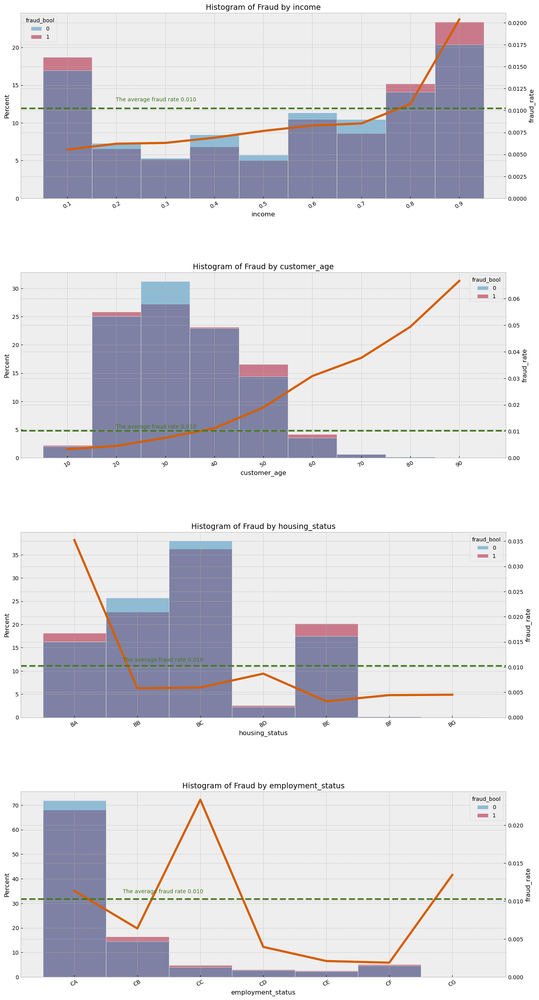

CPU times: user 38 s, sys: 551 ms, total: 38.6 s
Wall time: 42.7 s


In [17]:
%%time
customer = ['income', 'customer_age', 'housing_status', 'employment_status']

pm.build_plots(label='Customer', features=customer)

plt.show()

- Most fraudulent applications are found at the intersection of groups CA, CB, CC and BA, BB, BC.
  
- The higest fraud rates are in BA group and CC group.

- Most fraudulent applications are created by applicants aged 20 to 60. The number of applications from applicants with a high income level is much higher.

- However, many normal applications are submitted by leads from the same age group. Therefore, a high fraud rate may be observed only in the group of applicants over 50.

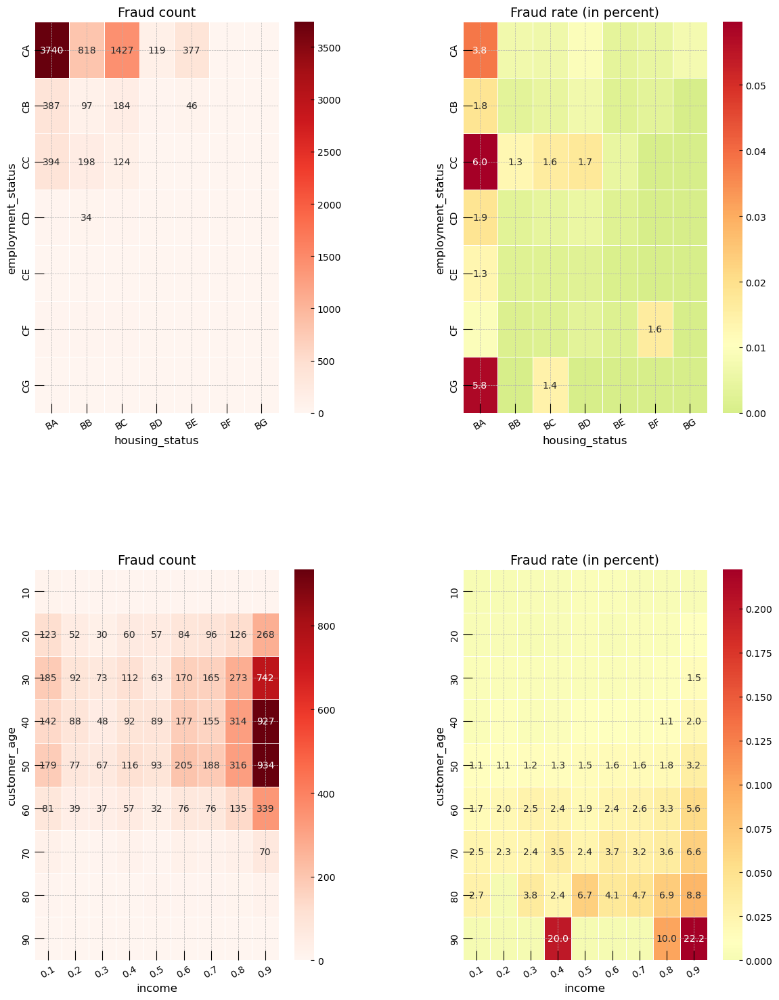

CPU times: user 8.6 s, sys: 153 ms, total: 8.75 s
Wall time: 9.42 s


In [18]:
%%time
tasks = [('task_0', ['employment_status', 'housing_status'], {}),
         ('task_1', ['customer_age', 'income'], {})]

pm.build_heatmaps(label='CustomerHeatmaps', tasks=tasks)
plt.show()

## Customer reliability

In [19]:
for column in ['prev_address_months_count', 'current_address_months_count', 'bank_months_count']:
    print(f'The proportion of missing values in {column} is {((pm.data[column] == -1).sum() / pm.data.shape[0]):.2%}')

The proportion of missing values in prev_address_months_count is 71.50%
The proportion of missing values in current_address_months_count is 0.38%
The proportion of missing values in bank_months_count is 25.10%


For the features *current_address_months_count* and *bank_months_count*, I will replace missing values with zeros, as this corresponds to their physical meaning.

Feature *prev_address_months_count* contains a lot of missing values, so I would not replace it - it will be missed mark.

In [20]:
pm.data.loc[pm.data.current_address_months_count==-1, 'current_address_months_count'] = 0
pm.data.loc[pm.data.bank_months_count==-1, 'bank_months_count'] = 0

- Applicants are more likely to provide a valid mobile phone number than a valid home phone number. An invalid mobile phone number is a stronger indicator of a fraudulent application than an invalid home phone number.

- If the similarity between the name and email address is less than 0.3, the fraud rate is higher than average

- If applicant has other cards, fraud rate of this group is twice lower than the average.

- Fraudulent applications indicate an address where the applicant has been registered for a greater number of months than in normal applications

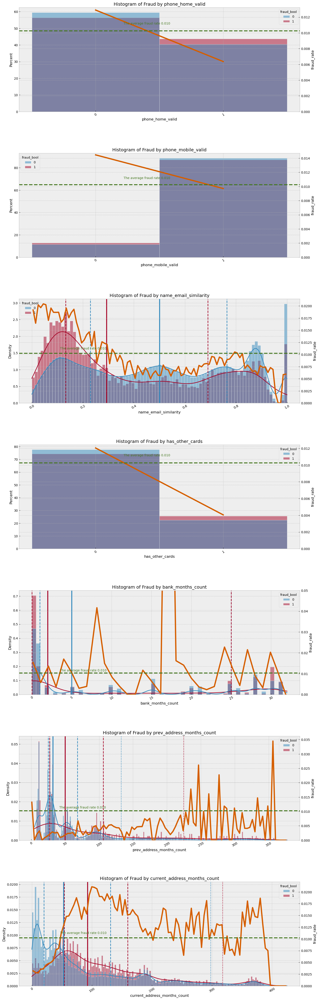

CPU times: user 1min 45s, sys: 1.4 s, total: 1min 46s
Wall time: 1min 46s


In [21]:
%%time
customer_reliability = ['phone_home_valid', 'phone_mobile_valid', 'name_email_similarity', 
                        'has_other_cards', 'bank_months_count', 
                        'prev_address_months_count', 'current_address_months_count']

pm.build_plots(label='CustomerReliability', features=customer_reliability, params={'prev_address_months_count': 1})

pm.figures['CustomerReliability'].axes['bank_months_count'][1].set_ylim(0, 0.05)

pm.make_plot(label='CustomerReliability', feature='prev_address_months_count', data=pm.data[pm.data['prev_address_months_count']>-1])


plt.show()

- The data is well separated by features *name_email_similarity* and *has_other_cards*. A large number of fraudulent applications are located in the area where the similarity is less than 0.4 and applicant doesn't have any cards. If also take into account *phone_home_valid* feature, the data will be splitted even better.

- Feature *phone_home_valid* allows for a good separation of fraudulent and normal applications.

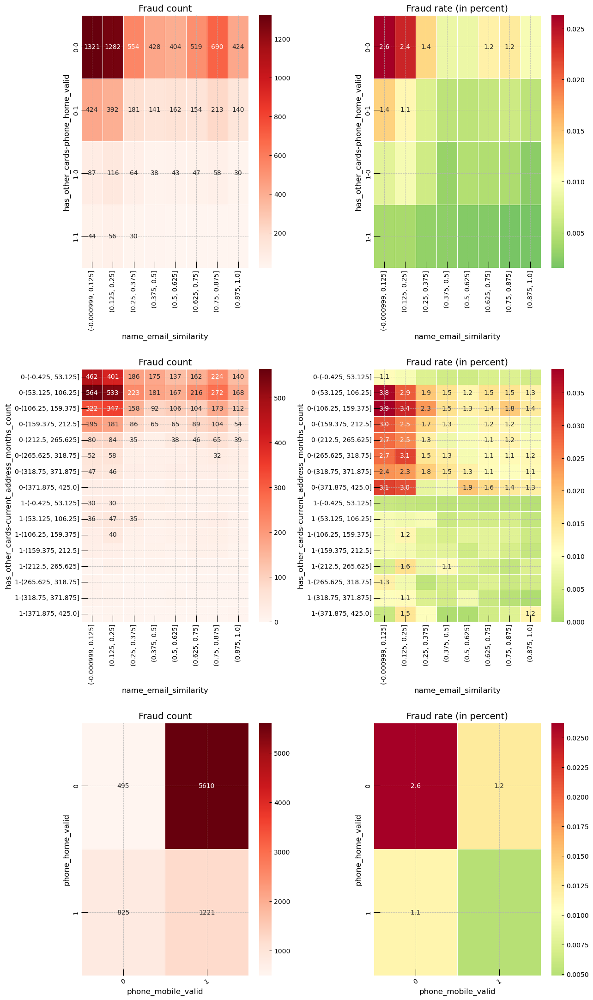

CPU times: user 13.8 s, sys: 283 ms, total: 14.1 s
Wall time: 14.6 s


In [22]:
%%time
tasks = [('task_0', ['has_other_cards', 'phone_home_valid', 'name_email_similarity'], {'name_email_similarity': 8}),
         ('task_1', ['has_other_cards', 'current_address_months_count', 'name_email_similarity'], {'current_address_months_count': 8, 'name_email_similarity': 8}),
         ('task_2', ['phone_home_valid', 'phone_mobile_valid'], {})]

pm.build_heatmaps(label='CustomerReliabilityHeatmaps', tasks=tasks)
plt.show()

## Application

To make it easier to understand, I will convert days into minutes.

In [23]:
pm.data = pm.data.rename(columns={'days_since_request': 'minutes_since_request'})
pm.data['minutes_since_request'] = pm.data['minutes_since_request'] * 24 * 60
pm.num_features.remove('days_since_request')
pm.num_features.append('minutes_since_request')

According to the dataset description, *intended_balcon_amount* negative values are missing. I will replace them with *-1*

In [24]:
pm.data.loc[pm.data.intended_balcon_amount<0, "intended_balcon_amount"] = -1

Only 26% are not missing

- The distributions of fraudulent and normal applications by the *intended_balcon_amount*  feature are very similar, but are unusual. A lot of applicant transferred about 50 or 100 dollars. 74% of data are missing.

- Approximetly 25% of application on credit plan AC. In this group fraud rate is the highest (0.016). In groups (AB and AD) fraud rates are on the average level. In the other groups fraud rates are lower.

- Feature *credit_risk_score* looks as a good feature: The distribution of fraudulent applications is skewed to the right relative to the distribution of normal applications. Ttherefore fraud_rate increases with increasing *credit_risk_score*

- If applicated sent from abroad the fraud rate is twice higher than average. But these applicaton are only 2.5% from the data.

- Fraud rate by the feature *proposed_credit_limit* up to 1000 dollars is still constant (on the average level), at 1500 dollars is larger, over 1900 it is more than 0.12.

- The most of sessions sessions last less than 100 minutes. The distributions are the same. They have a long tail

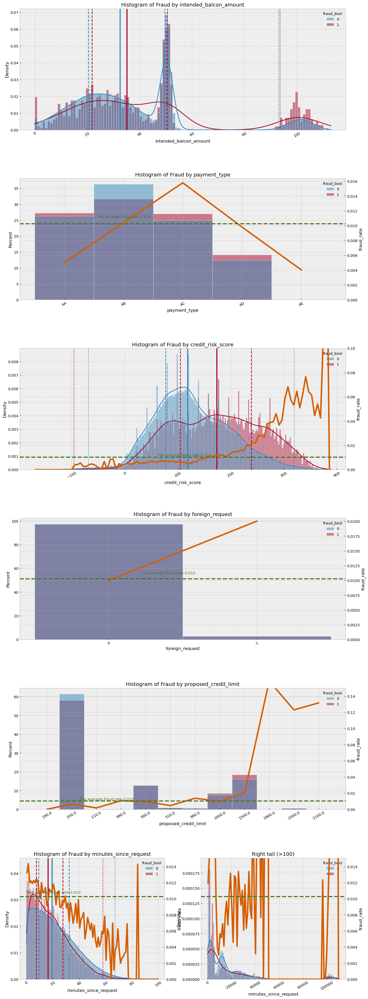

CPU times: user 1min 38s, sys: 1.37 s, total: 1min 39s
Wall time: 1min 39s


In [25]:
%%time
application = ['intended_balcon_amount', 'payment_type', 'credit_risk_score', 
               'foreign_request', 'proposed_credit_limit', 'minutes_since_request']


pm.build_plots(label='Application', features=application, params={'intended_balcon_amount': 1, 'minutes_since_request': 2})

feature = 'intended_balcon_amount'
axes = pm.figures['Application'].axes[feature]

_data = pm.data[pm.data[feature]>=0]
pm.make_plot(label='Application', feature=feature, data=_data, ax=axes[0], build_boxes=True, build_rate_plot=False)


feature = 'minutes_since_request'
axes = pm.figures['Application'].axes[feature]

_data = pm.data[pm.data[feature]<=100]
pm.make_plot(label='Application', feature=feature, data=_data, ax=axes[0], build_boxes=True, build_rate_plot=False)
_ax2 = axes[0].twinx()
pm.figures['Application'].axes[feature].append(_ax2)
pm.rate_plot(label='Application', feature=feature, data=_data, ax=_ax2, sep_plot=False, avg_line=False)
_ax2.axhline(y=pm.fraud_rate, color=pm.colors[3], linestyle='--', lw=3)
_ax2.text(x=_data[feature].min()+0.2, y=pm.fraud_rate * 1.04, s=f'The average fraud rate {pm.fraud_rate:.3f}', color=pm.colors[3])
_lim = _ax2.get_ylim()

_data = pm.data[pm.data[feature]>100]
pm.make_plot(label='Application', feature=feature, data=_data, ax=axes[1], build_boxes=False, build_rate_plot=False)
axes[1].set_title(f'Right tail (>100)')
_ax2 = axes[1].twinx()
pm.figures['Application'].axes[feature].append(_ax2)
pm.rate_plot(label='Application', feature=feature, data=_data, ax=_ax2, sep_plot=False, avg_line=False)
_ax2.axhline(y=pm.fraud_rate, color=pm.colors[3], linestyle='--', lw=3)
_ax2.set_ylim(_lim)

del _data

pm.figures['Application'].axes['credit_risk_score'][1].set_ylim(0, 0.1)
pm.figures['Application'].axes['proposed_credit_limit'][1].set_ylim(0, 0.15)

plt.show()

Feature *proposed_credit_limit* has only 12 unique values in the dataset. But actually it looks like numeric feature. I will split it to three splits and will use it as a category feature.

In [26]:
pm.data['proposed_credit_limit_coded'] = '0: up to 1000'
pm.data.loc[pm.data[pm.data['proposed_credit_limit']>=1000].index, 'proposed_credit_limit_coded'] = '1: 1000-1900'
pm.data.loc[pm.data[pm.data['proposed_credit_limit']>=1900].index, 'proposed_credit_limit_coded'] = '2: over 1900'

pm.cat_features.append('proposed_credit_limit_coded')

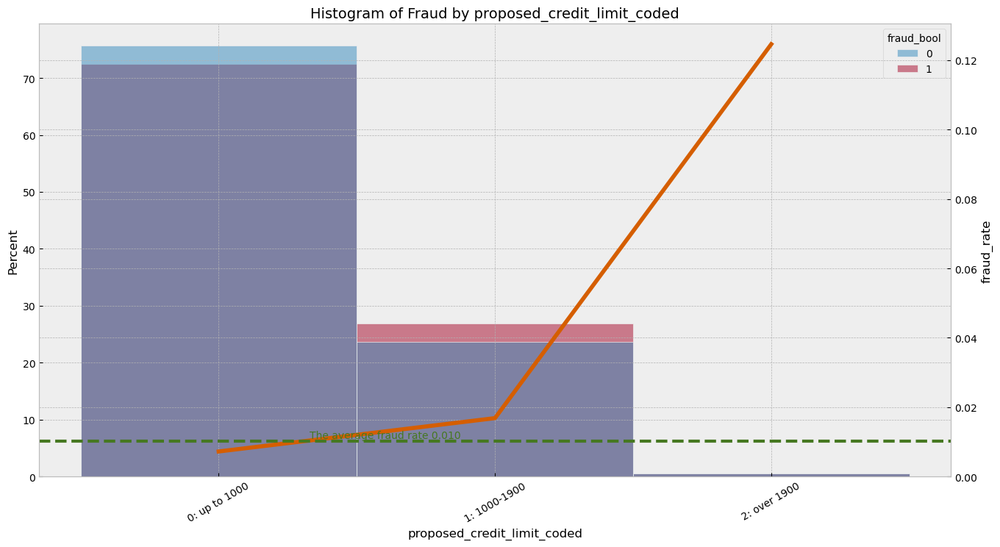

CPU times: user 8.57 s, sys: 145 ms, total: 8.72 s
Wall time: 9.02 s


In [27]:
%%time
feature = 'proposed_credit_limit_coded'

pm.build_plots(label=feature, features=[feature])

plt.show()

- A significant proportion of fraudulent applications are for AB and AC payment types and increase as the applicant's income increases. The fraud rate is more than 1% on applications with credit risk score more 200.

- The nmber of fraudulent applications increases with increase of credit risk score and proposed credit limit. I think, this is explained by the credit risk determination method, which takes into account proposed credit limit.

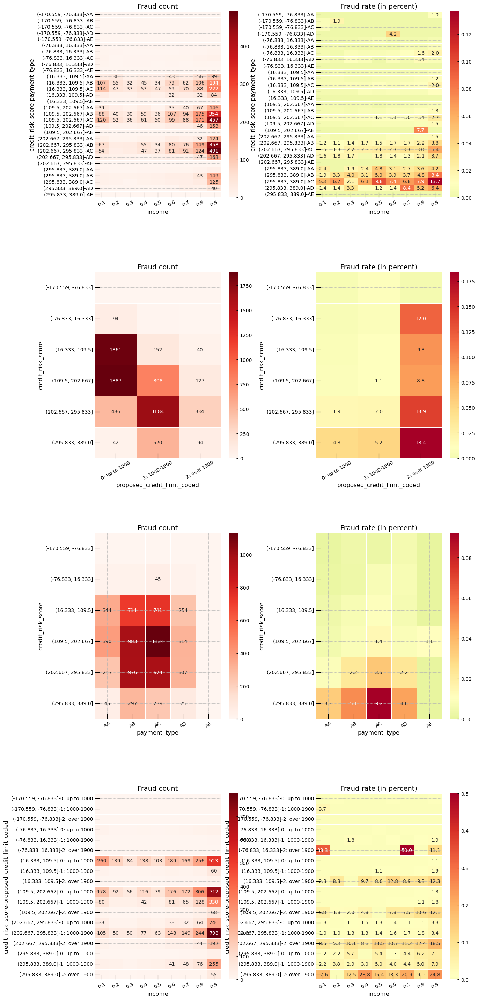

CPU times: user 29.5 s, sys: 731 ms, total: 30.2 s
Wall time: 33.7 s


In [28]:
%%time

tasks = [('task_0', ['credit_risk_score', 'payment_type', 'income'], {'credit_risk_score': 6}),
         ('task_1', ['credit_risk_score', 'proposed_credit_limit_coded'], {'credit_risk_score': 6}),
         ('task_2', ['credit_risk_score', 'payment_type'], {'credit_risk_score': 6}),
         ('task_3', ['credit_risk_score', 'proposed_credit_limit_coded', 'income'], {'credit_risk_score': 6}),]

pm.build_heatmaps(label='ApplicationHeatmaps', tasks=tasks)
plt.show()

## Device

Feature *device_distinct_emails_8w* has missing values. I will replace them with zeros - like there was no emails from the device.

In [29]:
print(np.sum(pm.data.device_distinct_emails_8w==-1) / len(pm.data))
pm.data.loc[pm.data.device_distinct_emails_8w==-1, 'device_distinct_emails_8w'] = 0

0.0003886846233092533


- Feature *source* looks very useless: almost all applications are sent via Internet, the fraud rates are very similar.
  
- The distributions of fraudulent and normal applications by the *session_length_in_minutes*  feature are very similar. The fraud rate increases only at the tail of the distribution, which can be considered outliers.
  
- Feature *device_os* distributed well, there are three aproximately equal, fraud rate of windows applicant is twice above the average. The fraud rate of Linux and "Other" applicants is twice lower the average.

- If there is 0 or 2 emails, the fraud rate is much higher than average (in 2 and 4 times). However, 96% of applicants sent only 1 email.

- Feature *keep_alive_session* distributed 43/57. Fraud rate is 0.016 and 0.006

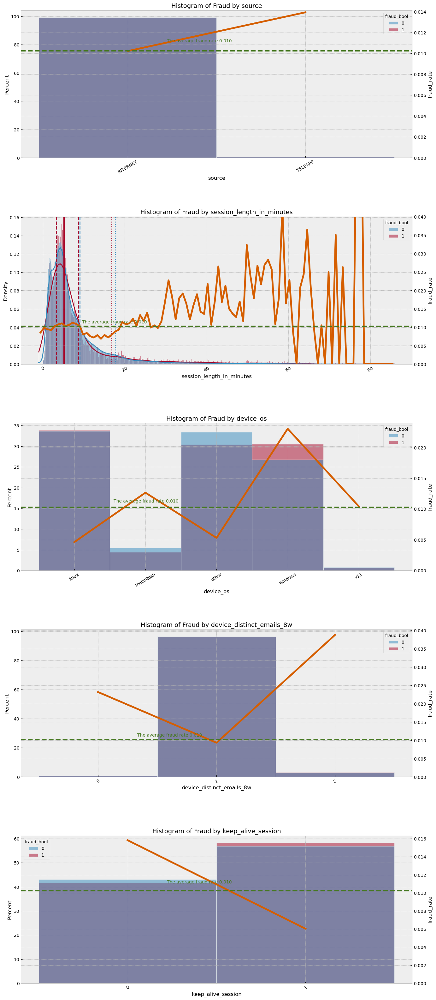

CPU times: user 1min 13s, sys: 979 ms, total: 1min 14s
Wall time: 1min 18s


In [30]:
%%time
device = ['source', 'session_length_in_minutes', 'device_os', 'device_distinct_emails_8w', 'keep_alive_session']

pm.build_plots(label='Device', features=device)
pm.figures['Device'].axes['session_length_in_minutes'][1].set_ylim(0, 0.04)
plt.show()

The distributions are really similar.

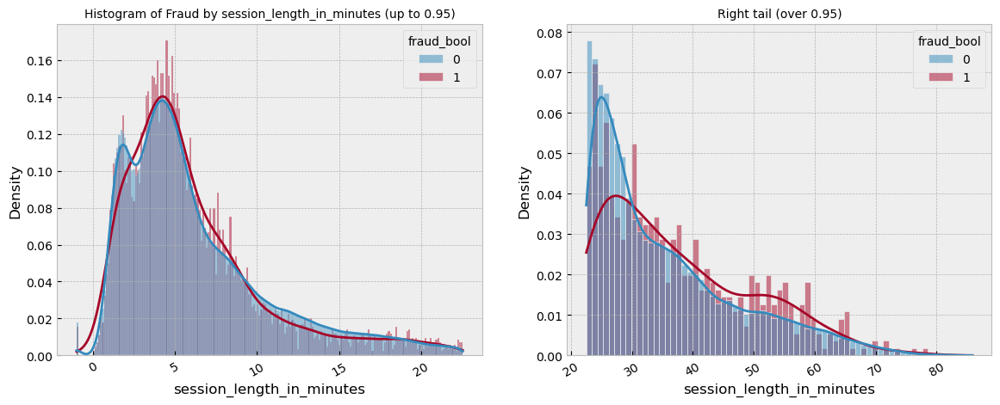

CPU times: user 28.7 s, sys: 654 ms, total: 29.4 s
Wall time: 28.2 s


In [31]:
%%time
feature = 'session_length_in_minutes'

pm.figures[feature] = pm.Figure()
pm.figures[feature].figure, axes = plt.subplots(1, 2, figsize=(14, 5))
_data = [pm.data[pm.data[feature] <= pm.data[feature].quantile(0.95)],
         pm.data[pm.data[feature] > pm.data[feature].quantile(0.95)]]

_title = [f'Histogram of Fraud by {feature} (up to 0.95)',
          f'Right tail (over 0.95)']   
for i, ax in enumerate(axes):
    pm.figures[feature].axes[f'{feature}_{i}'] = ax
    pm.make_plot(label=feature, feature=feature, build_rate_plot=False,
                 data=_data[i], ax=ax, build_boxes=False)
    ax.set_title(_title[i], fontsize=10)
    
del _data, _title
plt.show()

## Application metrics

- Fraud rate does not change significantly depending on the month.

- Distributions of fraudulent and normal applications looks similar by *velocity_6h*, *velocity_24h*.

- Large number of fraudulent applications are submitted to small bank branches (0 applications in 8 weeks)

- Feature *zip_count_4w* looks useless - distributions are same, fraud rate dispersion is low.

- The proportion of fraudulent applications with a date of birth that appeared in applications less than 5 times in the last 4 weeks is higher than in applications with a more frequent date of birth

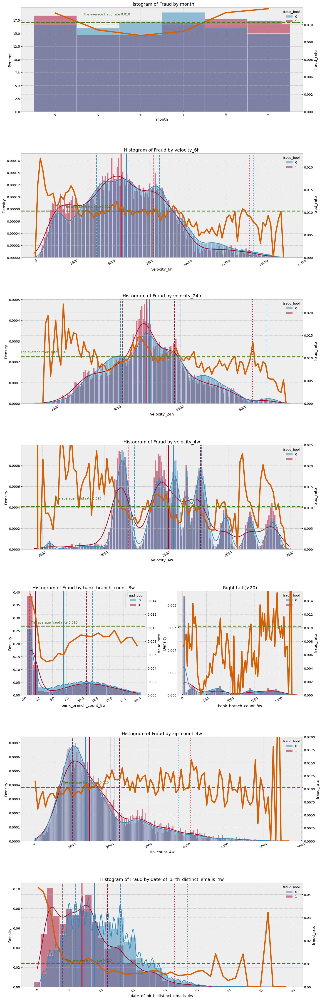

CPU times: user 2min 48s, sys: 2.96 s, total: 2min 51s
Wall time: 2min 53s


In [32]:
%%time
metrics = ['month', 'velocity_6h', 'velocity_24h', 'velocity_4w', 'bank_branch_count_8w', 
           'zip_count_4w', 'date_of_birth_distinct_emails_4w']

pm.build_plots(label='Metrics', features=metrics, params={'bank_branch_count_8w': 2, 'date_of_birth_distinct_emails_4w': 1})
pm.figures['Metrics'].axes['velocity_4w'][1].set_ylim(0, 0.025)
pm.figures['Metrics'].axes['velocity_4w'][1].texts[0].set_position((3200, 0.012))
pm.figures['Metrics'].axes['zip_count_4w'][1].set_ylim(0, 0.02)


_val = 20
feature = 'bank_branch_count_8w'
axes = pm.figures['Metrics'].axes[feature]

_data = pm.data[(pm.data[feature]>0) & (pm.data[feature]<=_val)]
pm.make_plot(label='Metrics', feature=feature, data=_data, ax=axes[0], build_boxes=True, build_rate_plot=False, discrete=True)
_ax2 = axes[0].twinx()
pm.figures['Metrics'].axes[feature].append(_ax2)
pm.rate_plot(label='Metrics', feature=feature, data=_data, ax=_ax2, sep_plot=False, avg_line=False)
_ax2.axhline(y=pm.fraud_rate, color=pm.colors[3], linestyle='--', lw=3)
_ax2.text(x=_data[feature].min()+0.2, y=pm.fraud_rate * 1.04, s=f'The average fraud rate {pm.fraud_rate:.3f}', color=pm.colors[3])
_lim = _ax2.get_ylim()

_data = pm.data[pm.data[feature]>_val]
pm.make_plot(label='Metrics', feature=feature, data=_data, ax=axes[1], build_boxes=False, build_rate_plot=False)
axes[1].set_title(f'Right tail (>{_val})')
_ax2 = axes[1].twinx()
pm.figures['Metrics'].axes[feature].append(_ax2)
pm.rate_plot(label='Metrics', feature=feature, data=_data, ax=_ax2, sep_plot=False, avg_line=False)
_ax2.axhline(y=pm.fraud_rate, color=pm.colors[3], linestyle='--', lw=3)
_ax2.set_ylim(_lim)

del _data

feature = 'date_of_birth_distinct_emails_4w'
pm.make_plot(label='Metrics', feature=feature, discrete=True)

plt.show()

- Fraudulent applications are submitted in small banks (low zip count and bank branch count).

- The proportion of fraudulent applications with a date of birth that appeared in applications less than 5 times in the last 4 weeks is higher than in applications with a more frequent date of birth

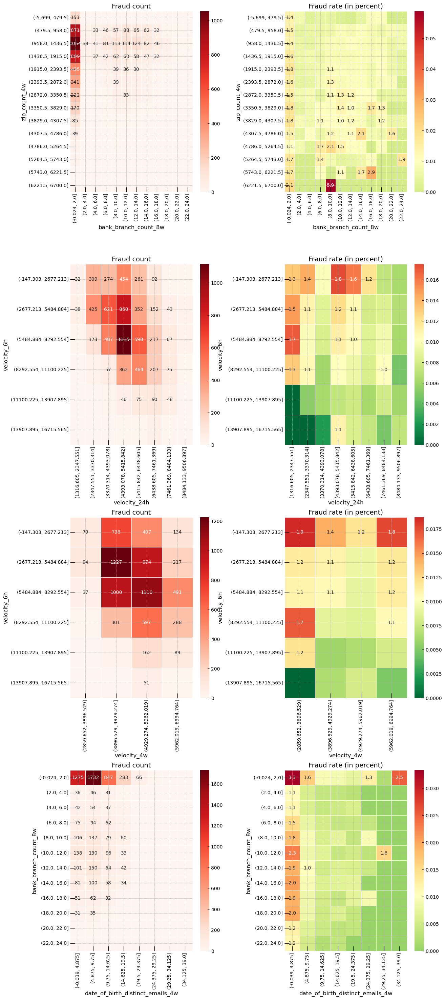

CPU times: user 25.7 s, sys: 820 ms, total: 26.5 s
Wall time: 28.4 s


In [33]:
%%time
bank_branch = pd.cut(pm.data[(pm.data.bank_branch_count_8w < 25)]['bank_branch_count_8w'], bins=12)
date_birth = pd.cut(pm.data['date_of_birth_distinct_emails_4w'], bins=8)

tasks = [('task_0', ['zip_count_4w', 'bank_branch_count_8w'], {'zip_count_4w': 14, 'bank_branch_count_8w': bank_branch}),
         ('task_1', ['velocity_6h', 'velocity_24h'], {'velocity_6h': 6, 'velocity_24h': 8}),
         ('task_2', ['velocity_6h', 'velocity_4w'], {'velocity_6h': 6, 'velocity_4w': 4}),
         ('task_3', ['bank_branch_count_8w', 'date_of_birth_distinct_emails_4w'], 
          {'bank_branch_count_8w': bank_branch, 'date_of_birth_distinct_emails_4w': date_birth})]

pm.build_heatmaps(label='MetricsHeatmaps', tasks=tasks)
plt.show()

## Distributions by feature *Month*

I use feature *Month* for train-test split and for cross-validation, so I want to see the distributions of the numeric features and how they change from month to month

Most of the features do not change depending on the month in which the application was submitted.

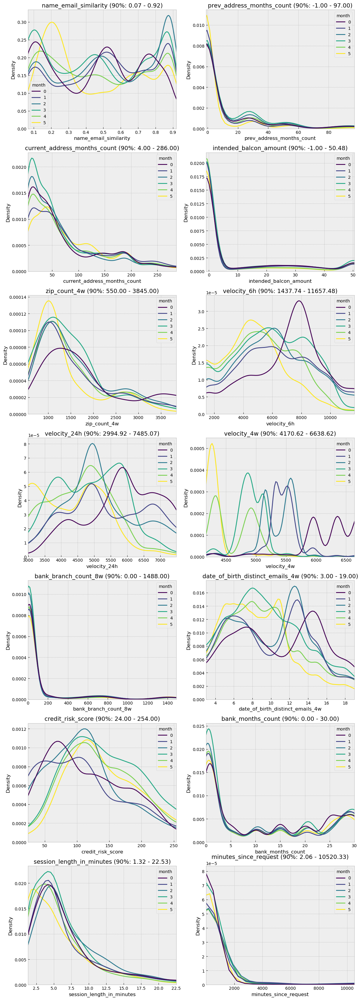

CPU times: user 1min 48s, sys: 3.63 s, total: 1min 52s
Wall time: 1min 31s


In [34]:
%%time

nrows = int(np.ceil(len(pm.num_features) / 2))

pm.figures["Months"] = pm.Figure()
pm.figures["Months"].figure, pm.figures["Months"].axes = plt.subplots(
    ncols=2, nrows=nrows, figsize=(14, 6 * nrows)
)

pm.figures["Months"].axes = pm.figures["Months"].axes.ravel()
_data = pm.data.sample(frac=0.25, random_state=42)

for i, feature in enumerate(pm.num_features):   
    sns.kdeplot(data=_data, x=feature, hue='month', palette='viridis', ax=pm.figures["Months"].axes[i])
    q_05, q_95 = pm.data[feature].quantile(0.05), pm.data[feature].quantile(0.95)
    pm.figures["Months"].axes[i].set_xlim(q_05, q_95)
    pm.figures["Months"].axes[i].set_title(f'{feature} (90%: {q_05:.2f} - {q_95:.2f})')

del _data

plt.show()

# Add new features

## PCA

Use Principal Component Analysis to unite velocity features

In [35]:
cols2pca = ['velocity_6h', 'velocity_24h', 'velocity_4w']

pca_df = pm.data[cols2pca].subtract(pm.data[cols2pca].mean())
pca = PCA(n_components = 1).fit(pca_df)
pca_df = pd.DataFrame(pca.transform(pca_df), columns = [f'Velocity_pca_{component}' for component in range(pca.n_components)])

pm.data = pd.concat([pm.data, pca_df], axis=1)
for col in pca_df.columns:
    pm.num_features.append(col)

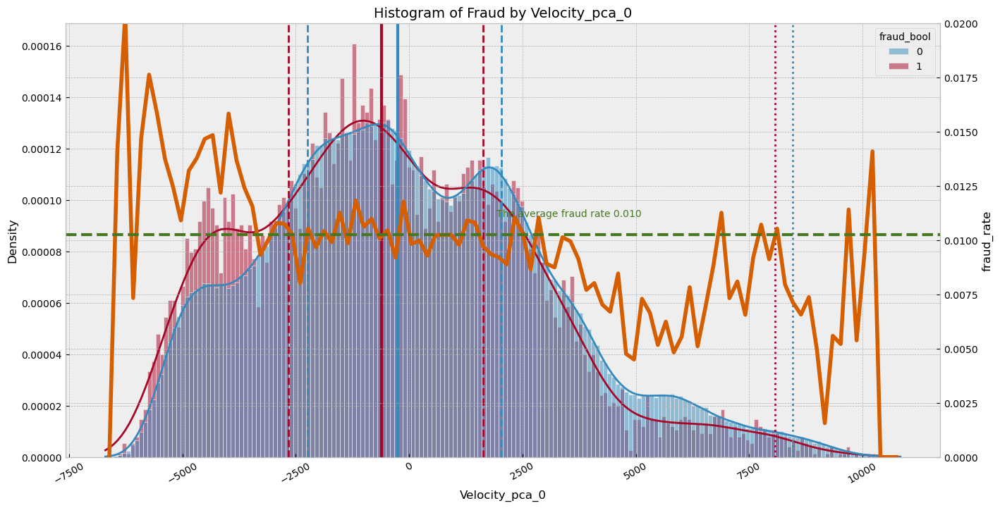

CPU times: user 27.1 s, sys: 526 ms, total: 27.7 s
Wall time: 27.8 s


In [36]:
%%time

pm.build_plots(label='PCA_velocity', features=['Velocity_pca_0'])
pm.figures['PCA_velocity'].axes['Velocity_pca_0'][1].set_ylim(0, 0.02)
plt.show()

## Similarities

I will write a function that for the Main Column feature will group by Column features and rank each category by frequency of occurrence. The function returns 0 if the record value corresponds to the most frequently occurring category for a given group or the numbers -1, -2, -3, and so on, corresponding to the rank.

In [37]:
%%time

def app_similarity(columns, main_column, df, inplace=True):

    if not inplace:
        df = df.copy()
    
    counts = (
        df.groupby(columns + [main_column], observed=True)
        .size()
        .reset_index(name='count')
    )
    
    counts[f'{main_column}_similarity_rank'] = -1 * (
        counts
        .sort_values(columns + ['count'], ascending=[True, True, False])
        .groupby(columns, observed=True)
        .cumcount()
    )
    
    df = df.merge(
        counts[columns + [main_column, f'{main_column}_similarity_rank']],
        on=columns + [main_column],
        how='left'
    )

    return df


to_sim_rank = ['device_os', 'phone_home_valid', 'employment_status', 'housing_status', 
                'has_other_cards', 'email_is_free', 'payment_type']

for feature in to_sim_rank:
    pm.data = app_similarity(columns = ['customer_age', 'income'], main_column=feature, df=pm.data)
    pm.cat_features.append(f'{feature}_similarity_rank')

CPU times: user 27.1 s, sys: 18.2 s, total: 45.3 s
Wall time: 49.5 s


- Fraud rate dispersion by *device_os_similarity_rank* is low

-  Fraud rate dispersion by *phone_home_valod_similarity_rank* approximately equals to 0

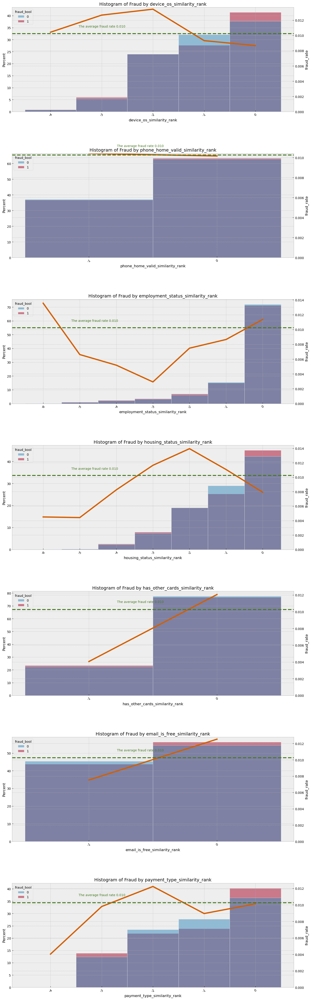

CPU times: user 49.5 s, sys: 1.65 s, total: 51.2 s
Wall time: 58.6 s


In [38]:
%%time

sim_rank = [f'{feature}_similarity_rank' for feature in to_sim_rank]
pm.build_plots(label='Similarities', features=sim_rank)
plt.show()

- Feature *has_other_cards_similarity_rank* completely repeats the *has_other_cards*

- Feature *email_is_free_similarity_rank* almost completely repeats the *email_is_free*

In [39]:
print(f'Proportion of coincidence by feature has_other_cards_similarity_rank: {np.sum((pm.data.has_other_cards==0) == (pm.data.has_other_cards_similarity_rank==0)) / len(pm.data)}')
print(f'Proportion of coincidence by feature email_is_free_similarity_rank: {np.sum((pm.data.email_is_free==1) == (pm.data.email_is_free_similarity_rank==0)) / len(pm.data)}')

Proportion of coincidence by feature has_other_cards_similarity_rank: 1.0
Proportion of coincidence by feature email_is_free_similarity_rank: 0.9770512547972362


In [40]:
_feat = ['phone_home_valid_similarity_rank', 'payment_type_similarity_rank', 
         'has_other_cards_similarity_rank', 'email_is_free_similarity_rank']
pm.data = pm.data.drop(_feat, axis=1)

for _f in _feat:
    pm.cat_features.remove(_f)

I'll write a function similar to the previous one - it will calculate the median value for the category and return how many times the value of the feature exceeds the median value for the actgoria

In [41]:
def app_ratio(columns, main_column, df, inplace=True):

    if not inplace:
        df = df.copy()

    counts = (
        df[columns + [main_column]].groupby(columns, observed=True)
        .median()
        .rename(columns={main_column:f'{main_column}_median'})
        .reset_index()
    )

    df = df.merge(
        counts[columns + [f'{main_column}_median']],
        on=columns,
        how='left'
    )

    df[f'{main_column}_ratio'] = df[main_column] / df[f'{main_column}_median']
    df = df.drop(f'{main_column}_median', axis=1)

    return df


for _feature in ['proposed_credit_limit', 'intended_balcon_amount']:
    pm.data = app_ratio(columns=['customer_age', 'income'], main_column=_feature, df=pm.data)
    
pm.cat_features.append('proposed_credit_limit_ratio')
pm.num_features.append('intended_balcon_amount_ratio')

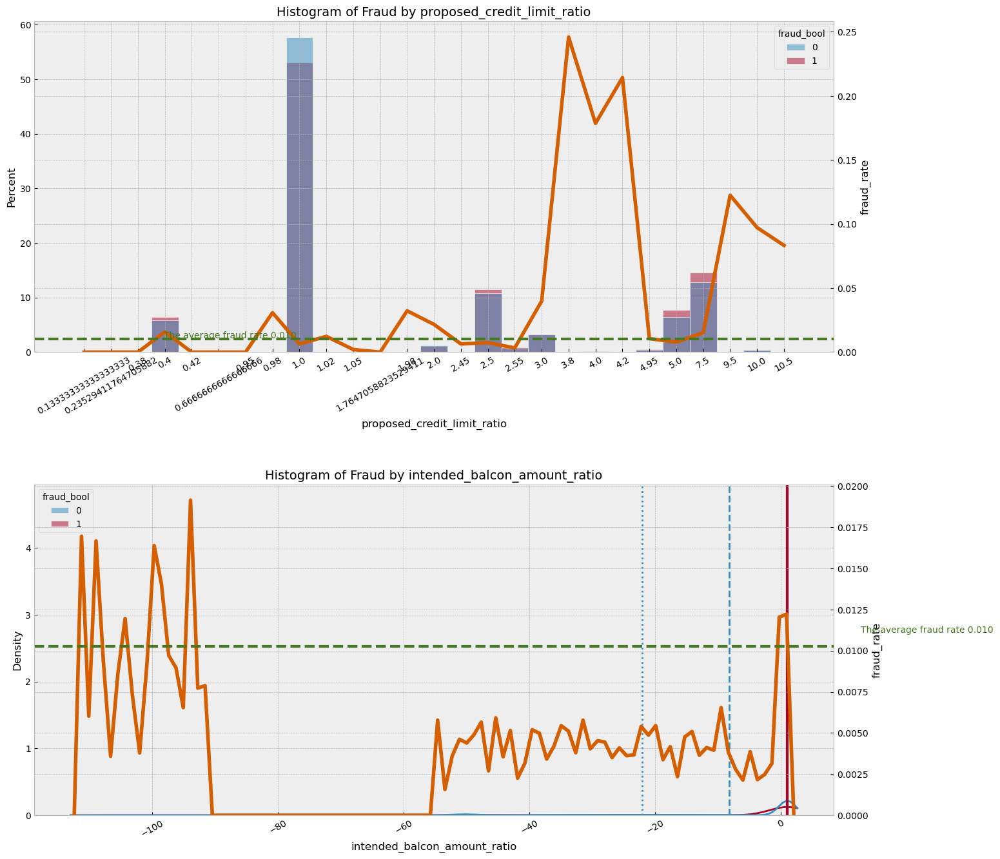

In [42]:
pm.build_plots(label='Ratios', features=['proposed_credit_limit_ratio', 'intended_balcon_amount_ratio'])
plt.show()

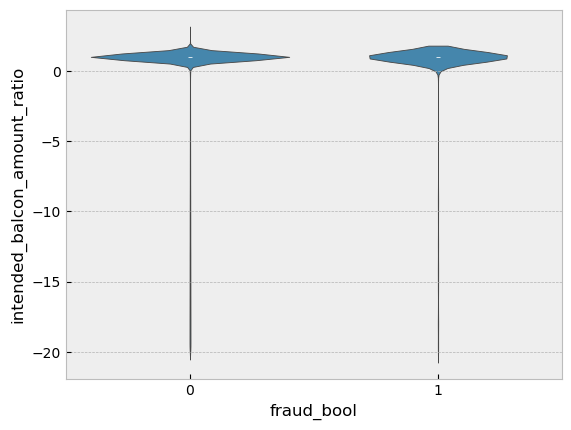

In [43]:
pm.figures['AmountRatio'] = pm.Figure
pm.figures['AmountRatio'].figure = plt.figure()

sns.violinplot(data=pm.data[pm.data.intended_balcon_amount_ratio>-20], y='intended_balcon_amount_ratio', x='fraud_bool')

plt.show()

The assumption did not come true

In [44]:
pm.data = pm.data.drop(['intended_balcon_amount_ratio', 'proposed_credit_limit_ratio'], axis=1)
pm.num_features.remove('intended_balcon_amount_ratio')
pm.cat_features.remove('proposed_credit_limit_ratio')

## Proposed credit limit is not round

I noticed that the column contains both round values: 200, 500, 1000, 2000, and rather unusual ones: 210, 510, 1900. I will write a function that returns 1 for such values.

In [45]:
def not_round(num):
    if (num >= 1000 and num % 500 == 0) or (num < 1000 and num % 100 == 0):
        return 0
    else:
        return 1

In [46]:
pm.data['proposed_credit_limit_not_round'] = np.zeros(pm.data.shape[0])
pm.data['proposed_credit_limit_not_round'] = pm.data['proposed_credit_limit'].apply(lambda x: not_round(x))
pm.cat_features.append('proposed_credit_limit_not_round')

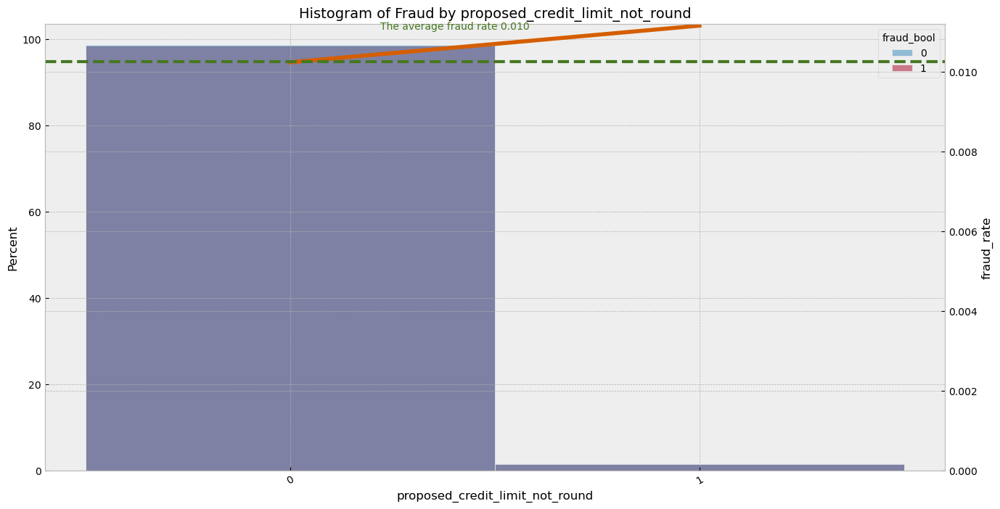

In [47]:
pm.build_plots(label='limit_not_round', features=['proposed_credit_limit_not_round'])    

plt.show()

The assumption did not come true

In [48]:
pm.data = pm.data.drop('proposed_credit_limit_not_round', axis=1)
pm.cat_features.remove('proposed_credit_limit_not_round')

## EDA-based splits

I will add a division based on EDA

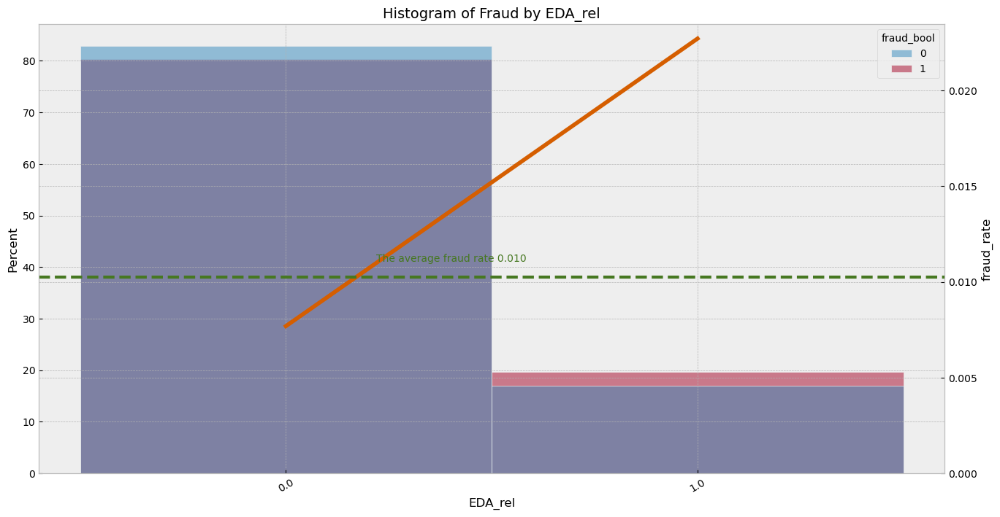

CPU times: user 8.66 s, sys: 284 ms, total: 8.94 s
Wall time: 9.13 s


In [49]:
%%time

feature = "EDA_rel"

pm.data[feature] = np.zeros(len(pm.data))
pm.data.loc[pm.data[(pm.data.name_email_similarity<0.35) & (pm.data.has_other_cards==0) & (pm.data.phone_home_valid==0)].index, feature] = 1
pm.cat_features.append(feature)

pm.build_plots(label=feature, features=[feature])    
plt.show()

# Feature Selection

I will simplify the dataset - combine rare categories, remove weak features

In [50]:
pm.data.loc[pm.data.housing_status.isin(["BD", "BF", "BG"]), "housing_status"] = "other"
pm.data.loc[pm.data.employment_status.isin(["CD", "CE", "CF", "CG"]), "employment_status"] = "other"
pm.data.loc[pm.data.device_os=="x11", "device_os"] = "other"
pm.data.loc[pm.data.device_distinct_emails_8w!=1, 'device_distinct_emails_8w'] = 2

pm.data.loc[pm.data.employment_status_similarity_rank<=-2, "employment_status_similarity_rank"] = -2
pm.data.loc[pm.data.housing_status_similarity_rank<=-2, "housing_status_similarity_rank"] = -2

In [51]:
features_to_drop = ['zip_count_4w', 'source', "proposed_credit_limit", "bank_months_count", "minutes_since_request"]

pm.data = pm.data.drop(features_to_drop, axis=1)

for feature in features_to_drop:
    if feature in pm.num_features:
        pm.num_features.remove(feature)
    elif feature in pm.cat_features:
        pm.cat_features.remove(feature)

# Correlations

I will use Spearman correlation instead of Pearson correlation, as it allows to capture nonlinear dependencies. Categorical features will be decoded using One Hot Encoding, with one of the categories removed.

In [52]:
corr_df = pm.data[[*pm.num_features, 'fraud_bool']].corr(method='spearman')

- The anti-correlation of the periods of residence at the specified addresses is quite logical.

- Velocity features correlate

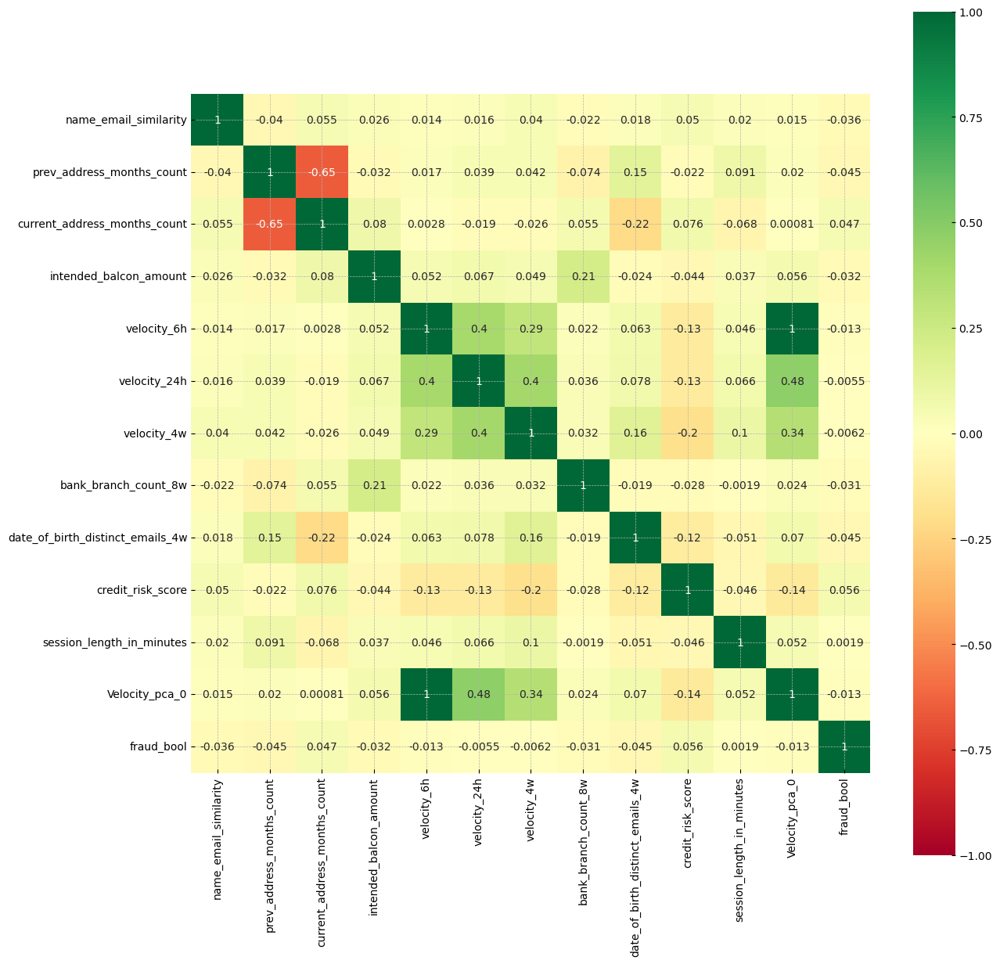

In [53]:
fig = plt.figure(figsize=(14, 14))
sns.heatmap(corr_df, cmap='RdYlGn', annot=True, square=True, vmin=-1, vmax=1)
plt.show()

In [54]:
%%time

cats = pm.cat_features.copy()
cats.remove('month')
cat_df = pd.get_dummies(pm.data[cats], dtype='int', drop_first=True)
cat_df = pd.concat([cat_df, pm.data['fraud_bool']], axis=1)

cat_corr = cat_df.corr(method='spearman')

CPU times: user 1min, sys: 2.33 s, total: 1min 2s
Wall time: 1min 5s


- No strong correlations were found.

- There are small correlations within the features.

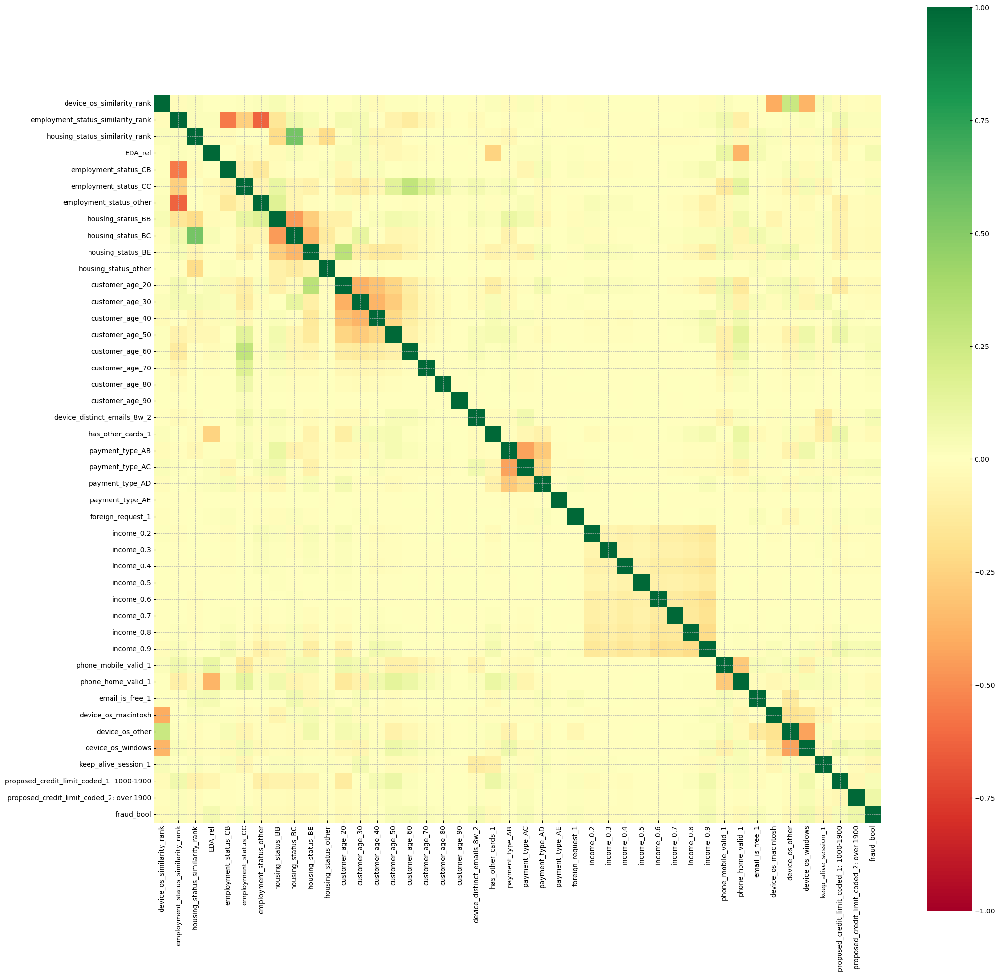

In [55]:
fig2= plt.figure(figsize=(24, 24))
sns.heatmap(cat_corr, cmap='RdYlGn', annot=False, square=True, vmin=-1, vmax=1)
plt.show()

Features *proposed_credit_limit* (>=1900), *device_os_windows*, *credit_risk_score*, *EDA_rel*, *income_0.9* are the most highly correlated with the target variable.

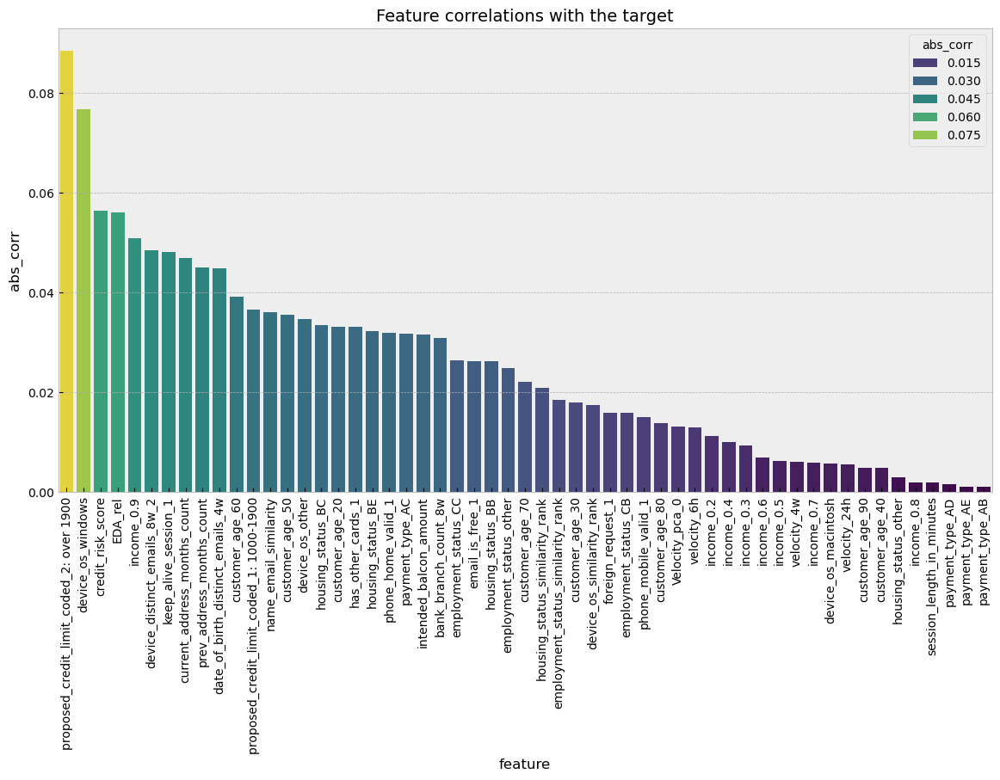

CPU times: user 3.31 s, sys: 73.8 ms, total: 3.39 s
Wall time: 3.45 s


In [56]:
%%time

target_corr = pd.DataFrame(
    pd.concat(
        [corr_df.loc[corr_df.index[:-1], 'fraud_bool'], cat_corr.loc[cat_corr.index[:-1], 'fraud_bool']], 
        axis=0)
).reset_index()

target_corr = target_corr.rename(columns={'fraud_bool': 'abs_corr', 'index': 'feature'})
target_corr['abs_corr'] = np.abs(target_corr['abs_corr'])
target_corr = target_corr.sort_values(by='abs_corr', ascending=False)

target_corr_fig = plt.figure(figsize=(14, 7))
sns.barplot(data=target_corr, x='feature', y='abs_corr', hue='abs_corr',  palette='viridis')

plt.xticks(rotation=90)

plt.title('Feature correlations with the target')
plt.show()

## Mutual information

In [57]:
X = pd.DataFrame(StandardScaler().fit_transform(
        pd.concat([
            pm.data[pm.num_features], 
            pm.data[pm.cat_features].apply(LabelEncoder().fit_transform)
        ], axis=1)
    ), columns=[*pm.num_features, *pm.cat_features]).drop("month", axis=1)

In [58]:
%%time
mi = mutual_info_classif(X, pm.data['fraud_bool'].astype('int'), n_jobs=-1)

CPU times: user 6.45 s, sys: 4.34 s, total: 10.8 s
Wall time: 7min 26s


The best features by mutual information test are: *email_is_free*, *has_other_cards*, *keep_alive_session*, *proposed_credit_limit*, and *phone_home_valid*

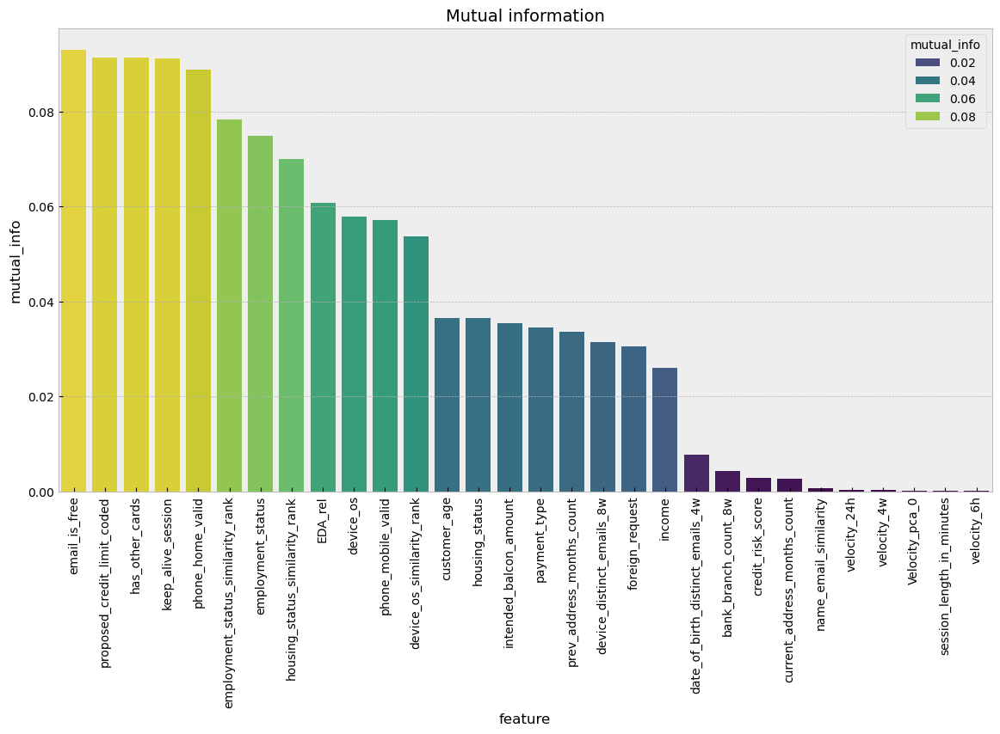

CPU times: user 2.62 s, sys: 85.7 ms, total: 2.71 s
Wall time: 2.98 s


In [59]:
%%time

mi_df = pd.DataFrame((zip(np.array(X.columns), mi)), columns=['feature', 'mutual_info']).sort_values(by='mutual_info', ascending=False)

mi_fig = plt.figure(figsize=(14, 7))
sns.barplot(data=mi_df, x='feature', y='mutual_info', hue='mutual_info',  palette='viridis')

plt.xticks(rotation=90)

plt.title('Mutual information')
plt.show()

## Feature importances

In [60]:
%%time

model = DecisionTreeClassifier(random_state=42, max_depth=20, class_weight='balanced')
model.fit(X,  pm.data["fraud_bool"].astype(int))

CPU times: user 1min 32s, sys: 233 ms, total: 1min 32s
Wall time: 1min 40s


DecisionTreeClassifier(class_weight='balanced', max_depth=20, random_state=42)

In [61]:
importances = model.feature_importances_

The best features by feature inportances test are: *housing_status*, *device_os*, *current_address_months_count*, and *velocity_24h*

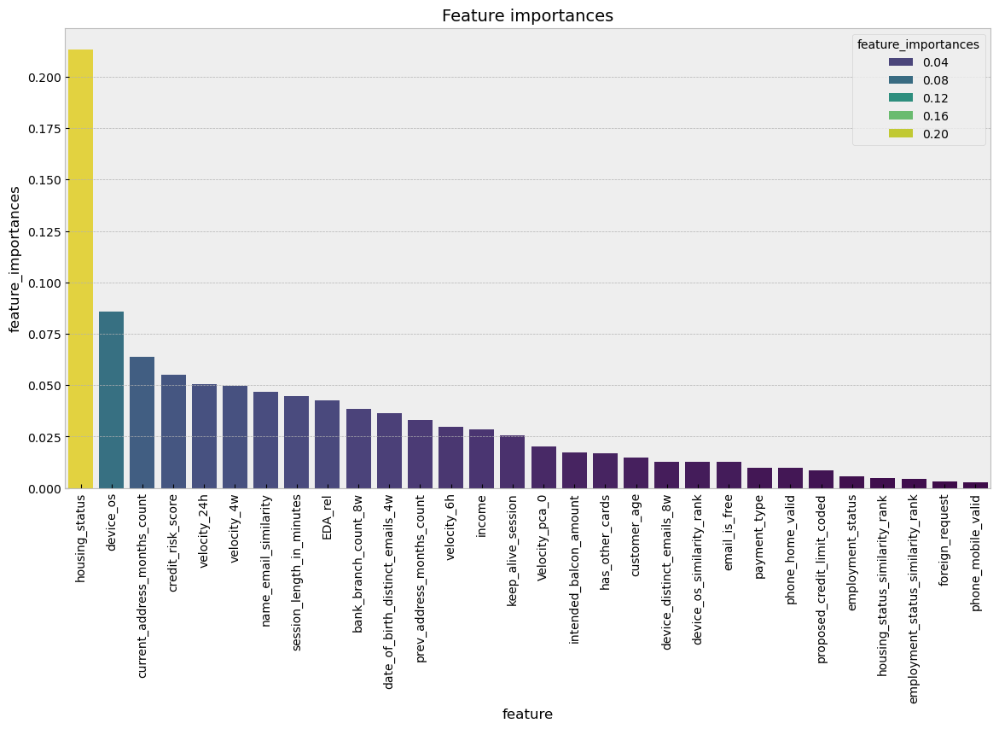

CPU times: user 2.52 s, sys: 65.6 ms, total: 2.59 s
Wall time: 2.78 s


In [62]:
%%time

fi_df = pd.DataFrame((zip(np.array(X.columns), importances)), columns=['feature', 'feature_importances']).sort_values(by='feature_importances', ascending=False)

fi_fig = plt.figure(figsize=(14, 7))
sns.barplot(data=fi_df, x='feature', y='feature_importances', hue='feature_importances',  palette='viridis')

plt.xticks(rotation=90)

plt.title('Feature importances')
plt.show()

# Conclusion

An exploratory analysis of the data was performed in this notebook.
The month feature was selected for division into train and test. Data from months 6 and 7 go to the test part. The division is 80/20.

The distribution of the target variable was examined. A strong imbalance was found in the data - fraudulent applications make up only 1% of the data.

The constant feature *device_fraud_count* was found and excluded, the values of which were equal to 0. However, this feature has a physical meaning and can be processed manually outside the model (for example, automatically classify the application as fraudulent)

The distributions of features were examined. Features *zip_count_4w*, *source*, *bank_months_count*, *minutes_since_request* had similar distributions of fraudulent and regular applications and were excluded.

The *proposed_credit_limit* feature was replaced with a categorical one containing 3 categories depending on the limit value.

Some rare categories were combined into the category *Other*

Correlation analysis, mutual information test and feature importances test were performed.